<a href="https://colab.research.google.com/github/Dinu7951/FedDrive/blob/main/SmartFedDriveipynb.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
# Required packages

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import sklearn as ski


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

In [ ]:
#Reading Dataset

df = pd.read_csv("futuristic_city_traffic.csv")
df

,City,Vehicle Type,Weather,Economic Condition,Day Of Week,Hour Of Day,Speed,Is Peak Hour,Random Event Occurred,Energy Consumption,Traffic Density
0,SolarisVille,Drone,Snowy,Stable,Sunday,20,29.4268,0.0,0.0,14.7134,0.5241
1,AquaCity,Flying Car,Solar Flare,Recession,Wednesday,2,118.8000,0.0,0.0,143.5682,0.3208
2,Neuroburg,Autonomous Vehicle,Solar Flare,Recession,Wednesday,16,100.3904,0.0,0.0,91.2640,0.0415
3,Ecoopolis,Drone,Clear,Booming,Thursday,8,76.8000,1.0,0.0,46.0753,0.1811
4,AquaCity,Autonomous Vehicle,Solar Flare,Stable,Saturday,16,45.2176,0.0,0.0,40.1934,0.4544
...,...,...,...,...,...,...,...,...,...,...,...
38376,SolarisVille,Autonomous Vehicle,Solar Flare,Recession,Monday,13,41.8541,0.0,0.0,33.4833,0.0394
38377,Ecoopolis,Drone,Clear,Recession,Thursday,9,103.9537,0.0,0.0,51.9768,0.0385
38378,AquaCity,Autonomous Vehicle,Electromagnetic Storm,Stable,Sunday,2,32.1610,0.0,0.0,25.7288,0.7222
38379,Ecoopolis,Autonomous Vehicle,Rainy,Recession,Saturday,14,17.5101,1.0,0.0,14.0081,0.1137


In [ ]:
df.shape

(38381, 11)

In [ ]:
df.isna().sum()

,0
City,0
Vehicle Type,0
Weather,0
Economic Condition,0
Day Of Week,0
Hour Of Day,0
Speed,0
Is Peak Hour,1
Random Event Occurred,1
Energy Consumption,1


In [ ]:
df.values

array([['SolarisVille', 'Drone', 'Snowy', ..., 0.0, 14.7134, 0.5241],
       ['AquaCity', 'Flying Car', 'Solar Flare', ..., 0.0, 143.5682,
        0.3208],
       ['Neuroburg', 'Autonomous Vehicle', 'Solar Flare', ..., 0.0,
        91.264, 0.0415],
       ...,
       ['AquaCity', 'Autonomous Vehicle', 'Electromagnetic Storm', ...,
        0.0, 25.7288, 0.7222],
       ['Ecoopolis', 'Autonomous Vehicle', 'Rainy', ..., 0.0, 14.0081,
        0.1137],
       ['AquaCity', 'Autonomous Vehicle', 'Electromagnetic Storm', ...,
        nan, nan, nan]], dtype=object)

In [ ]:
df = df[df['Vehicle Type'] != 'Flying Car']
df

,City,Vehicle Type,Weather,Economic Condition,Day Of Week,Hour Of Day,Speed,Is Peak Hour,Random Event Occurred,Energy Consumption,Traffic Density
0,SolarisVille,Drone,Snowy,Stable,Sunday,20,29.4268,0.0,0.0,14.7134,0.5241
2,Neuroburg,Autonomous Vehicle,Solar Flare,Recession,Wednesday,16,100.3904,0.0,0.0,91.2640,0.0415
3,Ecoopolis,Drone,Clear,Booming,Thursday,8,76.8000,1.0,0.0,46.0753,0.1811
4,AquaCity,Autonomous Vehicle,Solar Flare,Stable,Saturday,16,45.2176,0.0,0.0,40.1934,0.4544
5,TechHaven,Autonomous Vehicle,Snowy,Recession,Thursday,20,30.5179,0.0,0.0,37.5562,0.0843
...,...,...,...,...,...,...,...,...,...,...,...
38376,SolarisVille,Autonomous Vehicle,Solar Flare,Recession,Monday,13,41.8541,0.0,0.0,33.4833,0.0394
38377,Ecoopolis,Drone,Clear,Recession,Thursday,9,103.9537,0.0,0.0,51.9768,0.0385
38378,AquaCity,Autonomous Vehicle,Electromagnetic Storm,Stable,Sunday,2,32.1610,0.0,0.0,25.7288,0.7222
38379,Ecoopolis,Autonomous Vehicle,Rainy,Recession,Saturday,14,17.5101,1.0,0.0,14.0081,0.1137


In [ ]:
df.reset_index(drop=True, inplace=True)

In [ ]:
#Before Adding New Features
df

,City,Vehicle Type,Weather,Economic Condition,Day Of Week,Hour Of Day,Speed,Is Peak Hour,Random Event Occurred,Energy Consumption,Traffic Density
0,SolarisVille,Drone,Snowy,Stable,Sunday,20,29.4268,0.0,0.0,14.7134,0.5241
1,Neuroburg,Autonomous Vehicle,Solar Flare,Recession,Wednesday,16,100.3904,0.0,0.0,91.2640,0.0415
2,Ecoopolis,Drone,Clear,Booming,Thursday,8,76.8000,1.0,0.0,46.0753,0.1811
3,AquaCity,Autonomous Vehicle,Solar Flare,Stable,Saturday,16,45.2176,0.0,0.0,40.1934,0.4544
4,TechHaven,Autonomous Vehicle,Snowy,Recession,Thursday,20,30.5179,0.0,0.0,37.5562,0.0843
...,...,...,...,...,...,...,...,...,...,...,...
35809,SolarisVille,Autonomous Vehicle,Solar Flare,Recession,Monday,13,41.8541,0.0,0.0,33.4833,0.0394
35810,Ecoopolis,Drone,Clear,Recession,Thursday,9,103.9537,0.0,0.0,51.9768,0.0385
35811,AquaCity,Autonomous Vehicle,Electromagnetic Storm,Stable,Sunday,2,32.1610,0.0,0.0,25.7288,0.7222
35812,Ecoopolis,Autonomous Vehicle,Rainy,Recession,Saturday,14,17.5101,1.0,0.0,14.0081,0.1137


In [ ]:
# Adding of Additional New Features into the Dataset
df['Energy Efficiency'] = df['Speed'] + df['Energy Consumption']
df['Congestion Level'] = df['Traffic Density'] / df['Speed']
df['Peak Traffic Factor'] = df['Traffic Density'] * df['Is Peak Hour']
df['Traffic Pressure'] = df['Congestion Level'] * df['Is Peak Hour']

df


/tmp/ipython-input-372481170.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Energy Efficiency'] = df['Speed'] + df['Energy Consumption']
/tmp/ipython-input-372481170.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df['Congestion Level'] = df['Traffic Density'] / df['Speed']
/tmp/ipython-input-372481170.py:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: ht

,City,Vehicle Type,Weather,Economic Condition,Day Of Week,Hour Of Day,Speed,Is Peak Hour,Random Event Occurred,Energy Consumption,Traffic Density,Energy Efficiency,Congestion Level,Peak Traffic Factor,Traffic Pressure
0,SolarisVille,Drone,Snowy,Stable,Sunday,20,29.4268,0.0,0.0,14.7134,0.5241,44.1402,0.017810,0.0000,0.000000
1,Neuroburg,Autonomous Vehicle,Solar Flare,Recession,Wednesday,16,100.3904,0.0,0.0,91.2640,0.0415,191.6544,0.000413,0.0000,0.000000
2,Ecoopolis,Drone,Clear,Booming,Thursday,8,76.8000,1.0,0.0,46.0753,0.1811,122.8753,0.002358,0.1811,0.002358
3,AquaCity,Autonomous Vehicle,Solar Flare,Stable,Saturday,16,45.2176,0.0,0.0,40.1934,0.4544,85.4110,0.010049,0.0000,0.000000
4,TechHaven,Autonomous Vehicle,Snowy,Recession,Thursday,20,30.5179,0.0,0.0,37.5562,0.0843,68.0741,0.002762,0.0000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
35809,SolarisVille,Autonomous Vehicle,Solar Flare,Recession,Monday,13,41.8541,0.0,0.0,33.4833,0.0394,75.3374,0.000941,0.0000,0.000000
35810,Ecoopolis,Drone,Clear,Recession,Thursday,9,103.9537,0.0,0.0,51.9768,0.0385,155.9305,0.000370,0.0000,0.000000
35811,AquaCity,Autonomous Vehicle,Electromagnetic Storm,Stable,Sunday,2,32.1610,0.0,0.0,25.7288,0.7222,57.8898,0.022456,0.0000,0.000000
35812,Ecoopolis,Autonomous Vehicle,Rainy,Recession,Saturday,14,17.5101,1.0,0.0,14.0081,0.1137,31.5182,0.006493,0.1137,0.006493


In [ ]:
df.describe()

,Hour Of Day,Speed,Is Peak Hour,Random Event Occurred,Energy Consumption,Traffic Density,Energy Efficiency,Congestion Level,Peak Traffic Factor,Traffic Pressure
count,35814.000000,35814.000000,35813.000000,35813.000000,35813.000000,35813.000000,35813.000000,35813.000000,35813.000000,35813.000000
mean,11.483442,60.156367,0.156926,0.049172,48.010004,0.271818,108.167362,0.005873,0.044049,0.000933
std,6.938891,26.518751,0.363736,0.216230,23.837532,0.216506,48.637253,0.006651,0.137349,0.003501
min,0.000000,7.950600,0.000000,0.000000,5.605700,0.007100,14.311100,0.000077,0.000000,0.000000
25%,5.000000,37.774700,0.000000,0.000000,28.584400,0.103700,67.530100,0.001829,0.000000,0.000000
50%,11.000000,58.838200,0.000000,0.000000,44.841200,0.214200,105.079800,0.003828,0.000000,0.000000
75%,17.000000,80.514050,0.000000,0.000000,63.847400,0.390900,144.074700,0.007418,0.000000,0.000000
max,23.000000,163.088600,1.000000,1.000000,131.523800,2.336100,269.975900,0.130354,2.028600,0.099907


In [ ]:
#returns the datatypes of the features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 35814 entries, 0 to 35813
Data columns (total 15 columns):
 #   Column                 Non-Null Count  Dtype  
---  ------                 --------------  -----  
 0   City                   35814 non-null  object 
 1   Vehicle Type           35814 non-null  object 
 2   Weather                35814 non-null  object 
 3   Economic Condition     35814 non-null  object 
 4   Day Of Week            35814 non-null  object 
 5   Hour Of Day            35814 non-null  int64  
 6   Speed                  35814 non-null  float64
 7   Is Peak Hour           35813 non-null  float64
 8   Random Event Occurred  35813 non-null  float64
 9   Energy Consumption     35813 non-null  float64
 10  Traffic Density        35813 non-null  float64
 11  Energy Efficiency      35813 non-null  float64
 12  Congestion Level       35813 non-null  float64
 13  Peak Traffic Factor    35813 non-null  float64
 14  Traffic Pressure       35813 non-null  float64
dtypes:

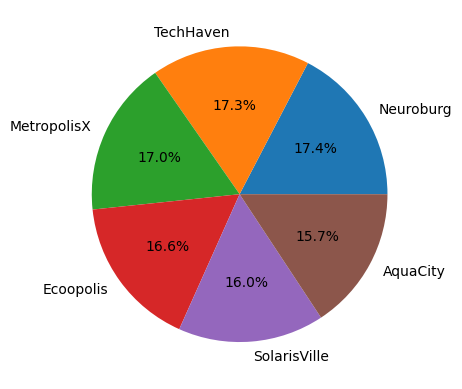

In [ ]:
#Visualisation of Categorical Values

count = df['City'].value_counts()
plt.pie(count,labels=count.index , autopct='%1.1f%%')
plt.show()

Vehicle Type
Autonomous Vehicle    23717
Drone                  9557
Car                    2540
Name: count, dtype: int64


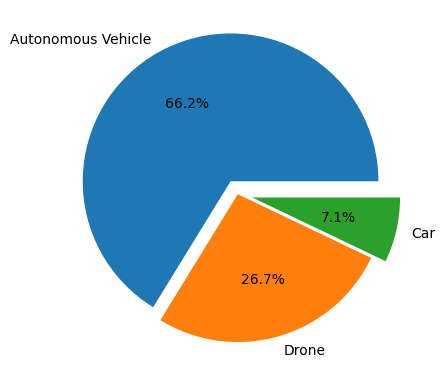

In [ ]:
count2 = df['Vehicle Type'].value_counts()
print(count2)
plt.pie(count2,labels=count2.index,autopct='%1.1f%%',explode=[0.1,0,0.1])
plt.show()

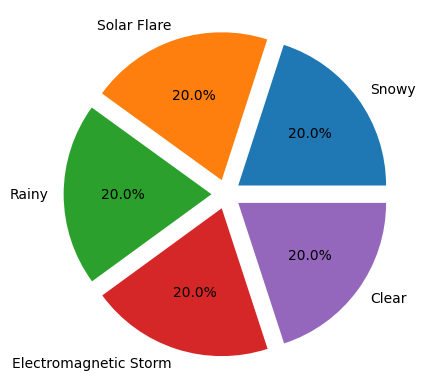

In [ ]:
count3 = df['Weather'].value_counts()
plt.pie(count3,labels=count3.index,autopct='%1.1f%%',explode=[0.1,0.1,0.1,0.1,0.1])
plt.show()

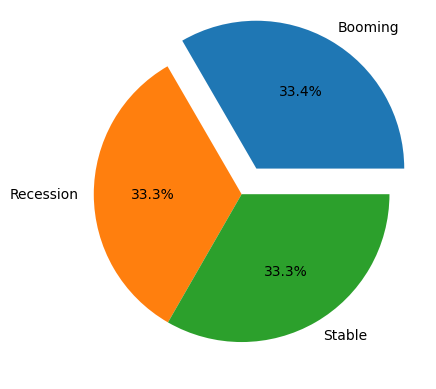

In [ ]:
count4 = df['Economic Condition'].value_counts()
plt.pie(count4,labels=count4.index,autopct='%1.1f%%',explode=[0.2,0,0])
plt.show()

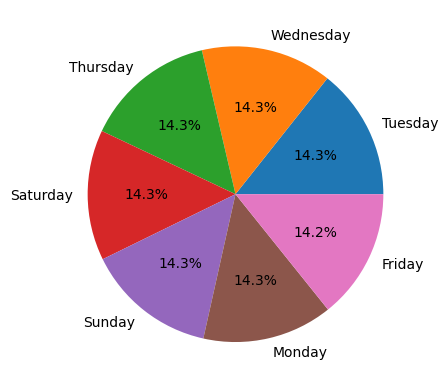

In [ ]:
count5 = df['Day Of Week'].value_counts();
plt.pie(count5,labels=count5.index,autopct='%1.1f%%')
plt.show()

In [ ]:
#Visualisation of Numerical Features
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1140703 entries, 0 to 1140702
Data columns (total 15 columns):
 #   Column                 Non-Null Count    Dtype  
---  ------                 --------------    -----  
 0   City                   1140703 non-null  object 
 1   Vehicle Type           1140703 non-null  object 
 2   Weather                1140703 non-null  object 
 3   Economic Condition     1140703 non-null  object 
 4   Day Of Week            1140703 non-null  object 
 5   Hour Of Day            1140703 non-null  int64  
 6   Speed                  1140703 non-null  float64
 7   Is Peak Hour           1140703 non-null  int64  
 8   Random Event Occurred  1140703 non-null  int64  
 9   Energy Consumption     1140703 non-null  float64
 10  Traffic Density        1140703 non-null  float64
 11  Energy Efficiency      1140703 non-null  float64
 12  Congestion Level       1140703 non-null  float64
 13  Peak Traffic Factor    1140703 non-null  float64
 14  Traffic Pressure  

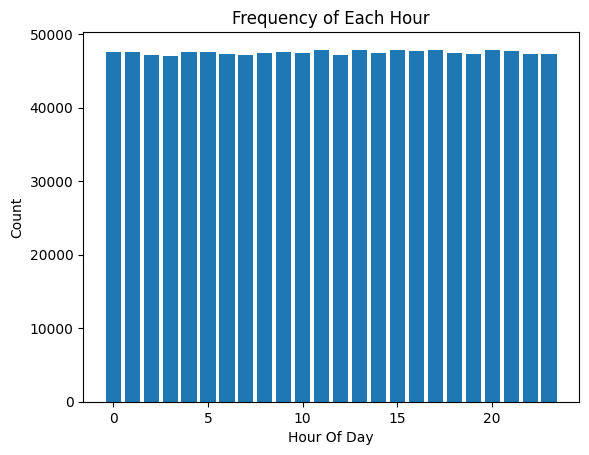

In [ ]:
num = df['Hour Of Day'].value_counts().sort_index()
plt.bar(num.index, num.values)
plt.xlabel('Hour Of Day')
plt.ylabel('Count')
plt.title('Frequency of Each Hour')
plt.show()

In [ ]:
#Encoding Categorical values into Numerical Values
from sklearn.preprocessing import OrdinalEncoder

categorical_cols = ['City', 'Vehicle Type', 'Weather', 'Economic Condition', 'Day Of Week', 'Is Peak Hour', 'Random Event Occurred']
encoder = OrdinalEncoder()
df[categorical_cols] = encoder.fit_transform(df[categorical_cols])

/tmp/ipython-input-1866790704.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df[categorical_cols] = encoder.fit_transform(df[categorical_cols])


In [ ]:
df.head()

,City,Vehicle Type,Weather,Economic Condition,Day Of Week,Hour Of Day,Speed,Is Peak Hour,Random Event Occurred,Energy Consumption,Traffic Density,Energy Efficiency,Congestion Level,Peak Traffic Factor,Traffic Pressure
0,4.0,2.0,3.0,2.0,3.0,20,29.4268,0.0,0.0,14.7134,0.5241,44.1402,0.017810,0.0000,0.000000
1,3.0,0.0,4.0,1.0,6.0,16,100.3904,0.0,0.0,91.2640,0.0415,191.6544,0.000413,0.0000,0.000000
2,1.0,2.0,0.0,0.0,4.0,8,76.8000,1.0,0.0,46.0753,0.1811,122.8753,0.002358,0.1811,0.002358
3,0.0,0.0,4.0,2.0,2.0,16,45.2176,0.0,0.0,40.1934,0.4544,85.4110,0.010049,0.0000,0.000000
4,5.0,0.0,3.0,1.0,4.0,20,30.5179,0.0,0.0,37.5562,0.0843,68.0741,0.002762,0.0000,0.000000


In [ ]:
df['Traffic Density'].max()

3.211

In [ ]:
df['Traffic Density'].min()

0.0059

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score

#Client 1
X = df[['City']]
y = df['Traffic Density']
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)


# Model Used
mlp = MLPRegressor(hidden_layer_sizes=(10, 5),activation='relu', max_iter=100, random_state=42)
mlp.fit(X_train_scaled, y_train)

sigma =0.01

def add_dp_noise(weights, sigma):
    noisy_weights = []
    for w in weights:
        noise = np.random.normal(0, sigma, size=w.shape)
        noisy_weights.append(w + noise)
    return noisy_weights

print("Original first layer weights sample:\n", mlp.coefs_[0][:5])
mlp.coefs_ = add_dp_noise(mlp.coefs_, sigma)

print("Noisy first layer weights sample:\n", mlp.coefs_[0][:5])
mlp.intercepts_ = add_dp_noise(mlp.intercepts_, sigma)
y_pred = mlp.predict(X_test_scaled)


local_output_train = mlp.predict(X_train_scaled)
local_output_test = mlp.predict(X_test_scaled)

# Traning client 1 dataset
df_train_outputs = pd.DataFrame({'City_output': local_output_train})
df_train_outputs['target'] = y_train.reset_index(drop=True)

#Testing client 1 dataset
df_test_outputs = pd.DataFrame({'City_output': local_output_test})
df_test_outputs['target'] = y_test.reset_index(drop=True)

df_train_outputs


Original first layer weights sample:
 [[-9.09620852e-316  3.26958543e-001  7.45222167e-001  2.62077893e-316
  -6.78206113e-001 -7.40289394e-001 -8.49890302e-001  8.23299357e-001
   2.12048969e-315  4.58433416e-001]]
Noisy first layer weights sample:
 [[-0.01728986  0.32520325  0.73744831  0.00756667 -0.65773168 -0.7222311
  -0.84709663  0.82356021 -0.00627615  0.47014035]]


,City_output,target
0,0.416945,0.2478
1,0.031797,0.0598
2,0.153157,0.2424
3,0.416945,0.4676
4,0.249883,0.1075
...,...,...
912557,0.416945,0.4675
912558,0.416945,0.7201
912559,0.431974,0.3990
912560,0.249883,0.2869


In [ ]:
# Client 2 Vehicle Type

X1 = df[['Vehicle Type']]
y1 = df['Traffic Density']

X1_train, X1_test, y1_train, y1_test = train_test_split(X1, y1, test_size=0.2, random_state=42)

X1_Scaled = scaler.fit_transform(X1_train)
X1_test_Scaled = scaler.transform(X1_test)

mlp.fit(X1_Scaled, y1_train)
sigma = 0.01

def add_dp_noise(weights, sigma):
    noisy_weights = []
    for w in weights:
        noise = np.random.normal(0, sigma, size=w.shape)
        noisy_weights.append(w + noise)
    return noisy_weights


mlp.coefs_ = add_dp_noise(mlp.coefs_, sigma)
mlp.intercepts_ = add_dp_noise(mlp.intercepts_, sigma)
y1_pred = mlp.predict(X1_test_Scaled)

local_output_train1 = mlp.predict(X1_Scaled)
local_output_test1 = mlp.predict(X1_test_Scaled)

df_train_outputs['Vehical_Outputs'] = local_output_train1
df_train_outputs['target'] = y_train.reset_index(drop=True)

df_test_outputs['Vehical_Outputs'] = local_output_test1
df_test_outputs['target'] = y_test.reset_index(drop=True)

df_train_outputs



,City_output,target,Vehical_Outputs
0,0.416945,0.2478,0.252488
1,0.031797,0.0598,0.296416
2,0.153157,0.2424,0.252488
3,0.416945,0.4676,0.252488
4,0.249883,0.1075,0.296416
...,...,...,...
912557,0.416945,0.4675,0.296416
912558,0.416945,0.7201,0.252488
912559,0.431974,0.3990,0.296416
912560,0.249883,0.2869,0.252488


In [ ]:
X2 = df[['Weather']]
y2 = df['Traffic Density']

X2_train, X2_test, y2_train, y2_test = train_test_split(X2, y2, test_size=0.2, random_state=42)

X2_Scaled = scaler.fit_transform(X2_train)
X2_test = scaler.transform(X2_test)

mlp.fit(X2_Scaled,y_train)
sigma = 0.01

def add_dp_noise(weights, sigma):
    noisy_weights = []
    for w in weights:
        noise = np.random.normal(0, sigma, size=w.shape)
        noisy_weights.append(w + noise)
    return noisy_weights


mlp.coefs_ = add_dp_noise(mlp.coefs_, sigma)
mlp.intercepts_ = add_dp_noise(mlp.intercepts_, sigma)
y2_pred = mlp.predict(X2_test)

local_output_train2 = mlp.predict(X2_Scaled)
local_output_test2 = mlp.predict(X2_test)

df_train_outputs['Weather_Outputs'] = local_output_train2
df_train_outputs['target'] = y_train.reset_index(drop=True)

df_test_outputs['Weather_Outputs'] = local_output_test2
df_test_outputs['target'] = y_test.reset_index(drop=True)

df_train_outputs

,City_output,target,Vehical_Outputs,Weather_Outputs
0,0.416945,0.2478,0.252488,0.269069
1,0.031797,0.0598,0.296416,0.265742
2,0.153157,0.2424,0.252488,0.271443
3,0.416945,0.4676,0.252488,0.290040
4,0.249883,0.1075,0.296416,0.271443
...,...,...,...,...
912557,0.416945,0.4675,0.296416,0.271443
912558,0.416945,0.7201,0.252488,0.283615
912559,0.431974,0.3990,0.296416,0.271443
912560,0.249883,0.2869,0.252488,0.269069


In [ ]:
X3 = df[['Economic Condition']]
y3 = df['Traffic Density']

X3_train, X3_test, y3_train, y3_test = train_test_split(X3, y3, test_size=0.2, random_state=42)

X3_Scaled = scaler.fit_transform(X3_train)
X3_test = scaler.transform(X3_test)

mlp.fit(X3_Scaled,y_train)
sigma = 0.01

def add_dp_noise(weights, sigma):
    noisy_weights = []
    for w in weights:
        noise = np.random.normal(0, sigma, size=w.shape)
        noisy_weights.append(w + noise)
    return noisy_weights


mlp.coefs_ = add_dp_noise(mlp.coefs_, sigma)
mlp.intercepts_ = add_dp_noise(mlp.intercepts_, sigma)
y3_pred = mlp.predict(X3_test)

local_output_train3 = mlp.predict(X3_Scaled)
local_output_test3 = mlp.predict(X3_test)

df_train_outputs['Economic_Outputs'] = local_output_train3
df_train_outputs['target'] = y_train.reset_index(drop=True)

df_test_outputs['Economic_Outputs'] = local_output_test3
df_test_outputs['target'] = y_test.reset_index(drop=True)

df_train_outputs



,City_output,target,Vehical_Outputs,Weather_Outputs,Economic_Outputs
0,0.416945,0.2478,0.252488,0.269069,0.142567
1,0.031797,0.0598,0.296416,0.265742,0.142567
2,0.153157,0.2424,0.252488,0.271443,0.345194
3,0.416945,0.4676,0.252488,0.290040,0.377543
4,0.249883,0.1075,0.296416,0.271443,0.142567
...,...,...,...,...,...
912557,0.416945,0.4675,0.296416,0.271443,0.345194
912558,0.416945,0.7201,0.252488,0.283615,0.345194
912559,0.431974,0.3990,0.296416,0.271443,0.377543
912560,0.249883,0.2869,0.252488,0.269069,0.377543


In [ ]:
X4 = df[['Day Of Week']]
y4 = df['Traffic Density']

X4_train, X4_test, y4_train, y4_test = train_test_split(X4, y4, test_size=0.2, random_state=42)

X4_Scaled = scaler.fit_transform(X4_train)
X4_test = scaler.transform(X4_test)

mlp.fit(X4_Scaled,y_train)
sigma = 0.01

def add_dp_noise(weights, sigma):
    noisy_weights = []
    for w in weights:
        noise = np.random.normal(0, sigma, size=w.shape)
        noisy_weights.append(w + noise)
    return noisy_weights


mlp.coefs_ = add_dp_noise(mlp.coefs_, sigma)
mlp.intercepts_ = add_dp_noise(mlp.intercepts_, sigma)


y4_pred = mlp.predict(X4_test)

local_output_train4 = mlp.predict(X4_Scaled)
local_output_test4 = mlp.predict(X4_test)

df_train_outputs['Day_Outputs'] = local_output_train4
df_train_outputs['target'] = y_train.reset_index(drop=True)

df_test_outputs['Day_Outputs'] = local_output_test4
df_test_outputs['target'] = y_test.reset_index(drop=True)

df_train_outputs

,City_output,target,Vehical_Outputs,Weather_Outputs,Economic_Outputs,Day_Outputs
0,0.416945,0.2478,0.252488,0.269069,0.142567,0.279932
1,0.031797,0.0598,0.296416,0.265742,0.142567,0.271619
2,0.153157,0.2424,0.252488,0.271443,0.345194,0.274195
3,0.416945,0.4676,0.252488,0.290040,0.377543,0.277657
4,0.249883,0.1075,0.296416,0.271443,0.142567,0.269042
...,...,...,...,...,...,...
912557,0.416945,0.4675,0.296416,0.271443,0.345194,0.269042
912558,0.416945,0.7201,0.252488,0.283615,0.345194,0.279932
912559,0.431974,0.3990,0.296416,0.271443,0.377543,0.271619
912560,0.249883,0.2869,0.252488,0.269069,0.377543,0.279932


In [ ]:
X5 = df[['Is Peak Hour']]
y5 = df['Traffic Density']

X5_train, X5_test, y5_train, y5_test = train_test_split(X5, y5, test_size=0.2,random_state=42)

X5_Scaled = scaler.fit_transform(X5_train)
X5_test = scaler.transform(X5_test)

mlp.fit(X5_Scaled,y_train)
sigma = 0.01

def add_dp_noise(weights, sigma):
    noisy_weights = []
    for w in weights:
        noise = np.random.normal(0, sigma, size=w.shape)
        noisy_weights.append(w + noise)
    return noisy_weights


mlp.coefs_ = add_dp_noise(mlp.coefs_, sigma)
mlp.intercepts_ = add_dp_noise(mlp.intercepts_, sigma)
y5_pred = mlp.predict(X5_test)

local_output_train5 = mlp.predict(X5_Scaled)
local_output_test5 = mlp.predict(X5_test)

df_train_outputs['Peak_Outputs'] = local_output_train5
df_train_outputs['target'] = y_train.reset_index(drop=True)

df_test_outputs['Peak_Outputs'] = local_output_test5
df_test_outputs['target'] = y_test.reset_index(drop=True)

df_train_outputs

,City_output,target,Vehical_Outputs,Weather_Outputs,Economic_Outputs,Day_Outputs,Peak_Outputs
0,0.416945,0.2478,0.252488,0.269069,0.142567,0.279932,0.278311
1,0.031797,0.0598,0.296416,0.265742,0.142567,0.271619,0.278311
2,0.153157,0.2424,0.252488,0.271443,0.345194,0.274195,0.278311
3,0.416945,0.4676,0.252488,0.290040,0.377543,0.277657,0.278311
4,0.249883,0.1075,0.296416,0.271443,0.142567,0.269042,0.278311
...,...,...,...,...,...,...,...
912557,0.416945,0.4675,0.296416,0.271443,0.345194,0.269042,0.278311
912558,0.416945,0.7201,0.252488,0.283615,0.345194,0.279932,0.269935
912559,0.431974,0.3990,0.296416,0.271443,0.377543,0.271619,0.269935
912560,0.249883,0.2869,0.252488,0.269069,0.377543,0.279932,0.278311


In [ ]:
scaler = StandardScaler()
mlp = MLPRegressor(hidden_layer_sizes=(32, 16), activation='relu', max_iter=500, random_state=42)

features = ['City','Vehicle Type','Weather','Economic Condition',
            'Day Of Week','Hour Of Day','Speed','Is Peak Hour',
            'Random Event Occurred','Energy Consumption',
            'Energy Efficiency','Congestion Level',
            'Peak Traffic Factor','Traffic Pressure']

train_dict = {}
test_dict = {}

# Differential Privacy Setup
epsilon = 1.0
delta = 1e-5
clip_value = 1.0
noise_scale = 0.2

# Function to clip gradients for privacy preservation
def clip_gradients(gradients, clip_value):
    norm = np.linalg.norm(gradients)
    if norm > clip_value:
        gradients = gradients * (clip_value / norm)
    return gradients

for feature in features:
    X = df[[feature]]
    y = df['Traffic Density']

    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    # Add Gaussian noise to ensure differential privacy
    X_train_noisy = X_train_scaled + np.random.normal(0, noise_scale, X_train_scaled.shape)

    mlp.fit(X_train_noisy, y_train)

    # Clip gradients to limit sensitivity
    for i in range(len(mlp.coefs_)):
        mlp.coefs_[i] = clip_gradients(mlp.coefs_[i], clip_value)

    train_pred = mlp.predict(X_train_scaled)
    test_pred = mlp.predict(X_test_scaled)

    train_dict[f"{feature}_pred"] = train_pred
    test_dict[f"{feature}_pred"] = test_pred

df_train_outputs = pd.DataFrame(train_dict)
df_train_outputs['target'] = y_train.reset_index(drop=True)

df_test_outputs = pd.DataFrame(test_dict)
df_test_outputs['target'] = y_test.reset_index(drop=True)


In [ ]:
df_train_outputs

,City_pred,Vehicle Type_pred,Weather_pred,Economic Condition_pred,Day Of Week_pred,Hour Of Day_pred,Speed_pred,Is Peak Hour_pred,Random Event Occurred_pred,Energy Consumption_pred,Energy Efficiency_pred,Congestion Level_pred,Peak Traffic Factor_pred,Traffic Pressure_pred,target
0,0.284516,0.252542,0.264424,0.126261,0.274284,0.276078,0.263206,0.270520,0.273099,0.262737,0.259050,0.261823,0.247857,0.255721,0.2478
1,0.177631,0.350220,0.264816,0.126261,0.268363,0.274470,0.268726,0.270520,0.273099,0.279369,0.274506,0.209010,0.247857,0.255721,0.0598
2,0.208278,0.252542,0.261647,0.212800,0.268363,0.274470,0.262391,0.270520,0.273099,0.262737,0.258805,0.257613,0.247857,0.255721,0.2424
3,0.284516,0.252542,0.286949,0.188705,0.274284,0.276078,0.262307,0.270520,0.273099,0.262737,0.258147,0.321160,0.247857,0.255721,0.4676
4,0.166885,0.350220,0.261647,0.126261,0.270514,0.270774,0.276039,0.270520,0.273099,0.281678,0.278082,0.242962,0.247857,0.255721,0.1075
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
912557,0.284516,0.350220,0.261647,0.212800,0.270514,0.276078,0.269349,0.270520,0.273099,0.279763,0.275697,0.352421,0.247857,0.255721,0.4675
912558,0.284516,0.252542,0.286949,0.212800,0.274284,0.268926,0.261840,0.279558,0.273099,0.262737,0.259010,0.345258,0.437707,0.324449,0.7201
912559,0.358089,0.350220,0.261647,0.188705,0.268363,0.276078,0.270293,0.279558,0.273099,0.280530,0.276963,0.338030,0.259978,0.315040,0.3990
912560,0.166885,0.252542,0.264424,0.188705,0.274284,0.276078,0.261889,0.270520,0.273099,0.262737,0.257341,0.253707,0.247857,0.255721,0.2869


In [ ]:
df_test_outputs


,City_pred,Vehicle Type_pred,Weather_pred,Economic Condition_pred,Day Of Week_pred,Hour Of Day_pred,Speed_pred,Is Peak Hour_pred,Random Event Occurred_pred,Energy Consumption_pred,Energy Efficiency_pred,Congestion Level_pred,Peak Traffic Factor_pred,Traffic Pressure_pred,target
0,0.351691,0.340035,0.286949,0.188705,0.268363,0.268853,0.267738,0.270520,0.273099,0.262737,0.265021,0.342092,0.247857,0.255721,0.4571
1,0.358089,0.350220,0.261647,0.126261,0.274284,0.276078,0.299828,0.270520,0.273099,0.262737,0.261601,0.212083,0.247857,0.255721,0.1428
2,0.177631,0.252542,0.286949,0.188705,0.270514,0.268853,0.261744,0.270520,0.273099,0.262737,0.260410,0.202178,0.247857,0.255721,0.0699
3,0.208278,0.350220,0.264816,0.212800,0.268363,0.276078,0.262251,0.270520,0.273099,0.277368,0.264321,0.252678,0.247857,0.255721,0.2397
4,0.208278,0.252542,0.286949,0.188705,0.274284,0.268853,0.261931,0.270520,0.273099,0.262737,0.258208,0.228706,0.247857,0.255721,0.1827
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
228136,0.358089,0.340035,0.264816,0.188705,0.274284,0.276078,0.261810,0.270520,0.273099,0.262737,0.264369,0.290045,0.247857,0.255721,0.4415
228137,0.208278,0.252542,0.261647,0.188705,0.274284,0.268853,0.277752,0.270520,0.273099,0.280676,0.278303,0.326794,0.247857,0.255721,0.1908
228138,0.358089,0.340035,0.264424,0.188705,0.274284,0.268853,0.269066,0.270520,0.273099,0.262737,0.267083,0.324128,0.247857,0.255721,0.3686
228139,0.177631,0.350220,0.261647,0.212800,0.274284,0.270774,0.265786,0.279558,0.273099,0.280196,0.274107,0.219334,0.120353,0.197513,0.1039


In [ ]:
pred_cols = [col for col in df_train_outputs.columns if col.endswith('_pred')]
df_train_outputs['FedAvg_pred'] = df_train_outputs[pred_cols].mean(axis=1)

In [ ]:
df_train_outputs

,City_pred,Vehicle Type_pred,Weather_pred,Economic Condition_pred,Day Of Week_pred,Hour Of Day_pred,Speed_pred,Is Peak Hour_pred,Random Event Occurred_pred,Energy Consumption_pred,Energy Efficiency_pred,Congestion Level_pred,Peak Traffic Factor_pred,Traffic Pressure_pred,target,FedAvg_pred
0,0.284516,0.252542,0.264424,0.126261,0.274284,0.276078,0.263206,0.270520,0.273099,0.262737,0.259050,0.261823,0.247857,0.255721,0.2478,0.255151
1,0.177631,0.350220,0.264816,0.126261,0.268363,0.274470,0.268726,0.270520,0.273099,0.279369,0.274506,0.209010,0.247857,0.255721,0.0598,0.252898
2,0.208278,0.252542,0.261647,0.212800,0.268363,0.274470,0.262391,0.270520,0.273099,0.262737,0.258805,0.257613,0.247857,0.255721,0.2424,0.254774
3,0.284516,0.252542,0.286949,0.188705,0.274284,0.276078,0.262307,0.270520,0.273099,0.262737,0.258147,0.321160,0.247857,0.255721,0.4676,0.265330
4,0.166885,0.350220,0.261647,0.126261,0.270514,0.270774,0.276039,0.270520,0.273099,0.281678,0.278082,0.242962,0.247857,0.255721,0.1075,0.255161
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
912557,0.284516,0.350220,0.261647,0.212800,0.270514,0.276078,0.269349,0.270520,0.273099,0.279763,0.275697,0.352421,0.247857,0.255721,0.4675,0.277157
912558,0.284516,0.252542,0.286949,0.212800,0.274284,0.268926,0.261840,0.279558,0.273099,0.262737,0.259010,0.345258,0.437707,0.324449,0.7201,0.287405
912559,0.358089,0.350220,0.261647,0.188705,0.268363,0.276078,0.270293,0.279558,0.273099,0.280530,0.276963,0.338030,0.259978,0.315040,0.3990,0.285471
912560,0.166885,0.252542,0.264424,0.188705,0.274284,0.276078,0.261889,0.270520,0.273099,0.262737,0.257341,0.253707,0.247857,0.255721,0.2869,0.250414


In [ ]:
df_train_outputs['FedAvg_pred'].mean()

np.float64(0.2630533033412706)

In [ ]:
from sklearn.preprocessing import StandardScaler
from sklearn.neural_network import MLPRegressor
from sklearn.metrics import mean_squared_error, r2_score

X_train = df_train_outputs.drop(columns=["target"])
df_test_outputs['FedAvg_pred'] = df_test_outputs[pred_cols].mean(axis=1)
X_test = df_test_outputs.drop(columns=["target"])

y_train = df_train_outputs["target"]
y_test = df_test_outputs["target"]

scaler = StandardScaler()
X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

mlp_main = MLPRegressor(
    hidden_layer_sizes=(32, 16),
    activation='relu',
    solver='adam',
    max_iter=300,
    random_state=42
)

mlp_main.fit(X_train_scaled, y_train)

y_train_pred = mlp_main.predict(X_train_scaled)
y_test_pred = mlp_main.predict(X_test_scaled)

print("Train MSE:", mean_squared_error(y_train, y_train_pred))
print("Train R² :", r2_score(y_train, y_train_pred))
print("Test MSE :", mean_squared_error(y_test, y_test_pred))
print("Test R²  :", r2_score(y_test, y_test_pred))

Train MSE: 0.00030431232725872494
Train R² : 0.9933739413779383
Test MSE : 0.0003163056626067229
Test R²  : 0.9930840072791127


In [ ]:
!pip install lime
from lime import lime_tabular

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 6.3 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=d95292eb1486532c465dcd53470690de1aacfc657ca4c00f3618c7b40e8dded6
  Stored in directory: /root/.cache/pip/wheels/e7/5d/0e/4b4fff9a47468fed5633211fb3b76d1db43fe806a17fb7486a
Successfully built lime


In [ ]:
print(X_train_scaled.shape)
print(X_test_scaled.shape)
feature_names = ['City_pred','Vehicle Type_pred','Weather_pred','Economic Condition_pred','Day Of Week_pred','Hour Of Day_pred','Speed_pred','Is Peak Hour_pred','Random Event Occurred_pred','Energy Consumption_pred','Energy Efficiency_pred','Congestion Level_pred','Peak Traffic Factor_pred','Traffic Pressure_pred','FedAvg_pred']
print(len(feature_names))

(912562, 15)
(228141, 15)
15


In [ ]:
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=feature_names,
    mode='regression'
)

for i in range(10):
    instance = X_test_scaled[i]
    exp = explainer.explain_instance(
        data_row=instance,
        predict_fn=lambda x: mlp_main.predict(x).flatten(),
        num_features=15
    )
    true_val = y_test.iloc[i]
    pred_val = mlp_main.predict([instance])[0]
    print(f"Instance {i+1}")
    print(f"True Traffic Density      : {true_val:.4f}")
    print(f"Predicted Traffic Density : {pred_val:.4f}")
    exp.show_in_notebook(show_table=True)



🔍 Instance 1
True Traffic Density      : 0.4571
Predicted Traffic Density : 0.4447

📈 Positive contributions (pushed prediction up):
  + Congestion Level_pred > 0.60   → +0.5340
  + FedAvg_pred > 0.59             → +0.2448
  + Traffic Pressure_pred <= -0.07 → +0.1405
  + -1.07 < Speed_pred <= -0.03    → +0.0723
  + Energy Consumption_pred <= -1.11 → +0.0367
  + Is Peak Hour_pred <= -0.43     → +0.0235
  + Peak Traffic Factor_pred <= 0.10 → +0.0073
  + Day Of Week_pred <= -1.39      → +0.0020
  + Hour Of Day_pred <= -1.02      → +0.0016
  + -0.95 < Energy Efficiency_pred <= 0.18 → +0.0004

📉 Negative contributions (pulled prediction down):
  - -0.62 < City_pred <= 1.23      → -0.0445
  - -0.71 < Weather_pred <= 1.22   → -0.0258
  - -0.71 < Vehicle Type_pred <= 1.45 → -0.0102
  - -1.36 < Economic Condition_pred <= 0.35 → -0.0012

🧾 Explanation:
The model predicted a traffic density of 0.4447 because:
  • These features increased the prediction: Congestion Level_pred > 0.60, FedAvg_pred 


🔍 Instance 2
True Traffic Density      : 0.1428
Predicted Traffic Density : 0.1686

📈 Positive contributions (pushed prediction up):
  + Traffic Pressure_pred <= -0.07 → +0.1196
  + Energy Efficiency_pred <= -0.95 → +0.0551
  + Energy Consumption_pred <= -1.11 → +0.0508
  + Weather_pred <= -0.74          → +0.0237
  + Economic Condition_pred <= -1.36 → +0.0197
  + Is Peak Hour_pred <= -0.43     → +0.0165
  + -1.39 < Day Of Week_pred <= 0.84 → +0.0136

📉 Negative contributions (pulled prediction down):
  - Congestion Level_pred <= -0.81 → -0.3045
  - Speed_pred > 0.75              → -0.1856
  - City_pred > 1.23               → -0.0548
  - Peak Traffic Factor_pred <= 0.10 → -0.0275
  - -0.71 < Vehicle Type_pred <= 1.45 → -0.0151
  - -0.45 < Hour Of Day_pred <= 1.10 → -0.0134
  - -0.08 < FedAvg_pred <= 0.59    → -0.0013

🧾 Explanation:
The model predicted a traffic density of 0.1686 because:
  • These features increased the prediction: Traffic Pressure_pred <= -0.07, Energy Efficiency_pr


🔍 Instance 3
True Traffic Density      : 0.0699
Predicted Traffic Density : 0.0630

📈 Positive contributions (pushed prediction up):
  + Speed_pred <= -1.07            → +0.1704
  + Traffic Pressure_pred <= -0.07 → +0.1253
  + Energy Efficiency_pred <= -0.95 → +0.0525
  + City_pred <= -1.01             → +0.0465
  + Energy Consumption_pred <= -1.11 → +0.0431
  + -1.39 < Day Of Week_pred <= 0.84 → +0.0252
  + Hour Of Day_pred <= -1.02      → +0.0189
  + Vehicle Type_pred <= -0.71     → +0.0169
  + Is Peak Hour_pred <= -0.43     → +0.0152

📉 Negative contributions (pulled prediction down):
  - Congestion Level_pred <= -0.81 → -0.3177
  - FedAvg_pred <= -0.72           → -0.1589
  - -0.71 < Weather_pred <= 1.22   → -0.0222
  - -1.36 < Economic Condition_pred <= 0.35 → -0.0087
  - Peak Traffic Factor_pred <= 0.10 → -0.0075

🧾 Explanation:
The model predicted a traffic density of 0.0630 because:
  • These features increased the prediction: Speed_pred <= -1.07, Traffic Pressure_pred <= -0.0


🔍 Instance 4
True Traffic Density      : 0.2397
Predicted Traffic Density : 0.2498

📈 Positive contributions (pushed prediction up):
  + Speed_pred <= -1.07            → +0.1710
  + Traffic Pressure_pred <= -0.07 → +0.1417
  + -1.01 < City_pred <= -0.62     → +0.0285
  + -1.11 < Energy Consumption_pred <= 0.62 → +0.0137
  + -0.74 < Weather_pred <= -0.71  → +0.0131
  + Is Peak Hour_pred <= -0.43     → +0.0126
  + -0.08 < FedAvg_pred <= 0.59    → +0.0054
  + -0.95 < Energy Efficiency_pred <= 0.18 → +0.0043

📉 Negative contributions (pulled prediction down):
  - -0.81 < Congestion Level_pred <= -0.26 → -0.1909
  - -0.71 < Vehicle Type_pred <= 1.45 → -0.0329
  - 0.35 < Economic Condition_pred <= 1.01 → -0.0149
  - Peak Traffic Factor_pred <= 0.10 → -0.0031
  - -0.45 < Hour Of Day_pred <= 1.10 → -0.0019
  - Day Of Week_pred <= -1.39      → -0.0002

🧾 Explanation:
The model predicted a traffic density of 0.2498 because:
  • These features increased the prediction: Speed_pred <= -1.07, Traff


🔍 Instance 5
True Traffic Density      : 0.1827
Predicted Traffic Density : 0.1716

📈 Positive contributions (pushed prediction up):
  + Speed_pred <= -1.07            → +0.1604
  + Traffic Pressure_pred <= -0.07 → +0.1436
  + Energy Efficiency_pred <= -0.95 → +0.0725
  + Energy Consumption_pred <= -1.11 → +0.0338
  + -1.01 < City_pred <= -0.62     → +0.0263
  + -1.36 < Economic Condition_pred <= 0.35 → +0.0117
  + -1.39 < Day Of Week_pred <= 0.84 → +0.0101
  + Vehicle Type_pred <= -0.71     → +0.0073
  + Hour Of Day_pred <= -1.02      → +0.0016

📉 Negative contributions (pulled prediction down):
  - -0.81 < Congestion Level_pred <= -0.26 → -0.1912
  - FedAvg_pred <= -0.72           → -0.1545
  - Peak Traffic Factor_pred <= 0.10 → -0.0345
  - -0.71 < Weather_pred <= 1.22   → -0.0102
  - Is Peak Hour_pred <= -0.43     → -0.0025

🧾 Explanation:
The model predicted a traffic density of 0.1716 because:
  • These features increased the prediction: Speed_pred <= -1.07, Traffic Pressure_pred


🔍 Instance 6
True Traffic Density      : 0.3551
Predicted Traffic Density : 0.3637

📈 Positive contributions (pushed prediction up):
  + Congestion Level_pred > 0.60   → +0.4934
  + FedAvg_pred > 0.59             → +0.2362
  + Traffic Pressure_pred <= -0.07 → +0.1278
  + Vehicle Type_pred <= -0.71     → +0.0139
  + -1.39 < Day Of Week_pred <= 0.84 → +0.0043
  + Hour Of Day_pred <= -1.02      → +0.0020
  + Is Peak Hour_pred <= -0.43     → +0.0001

📉 Negative contributions (pulled prediction down):
  - Speed_pred > 0.75              → -0.2039
  - Energy Consumption_pred > 0.93 → -0.0680
  - City_pred > 1.23               → -0.0571
  - Energy Efficiency_pred > 0.78  → -0.0366
  - -0.71 < Weather_pred <= 1.22   → -0.0180
  - Peak Traffic Factor_pred <= 0.10 → -0.0097
  - 0.35 < Economic Condition_pred <= 1.01 → -0.0067

🧾 Explanation:
The model predicted a traffic density of 0.3637 because:
  • These features increased the prediction: Congestion Level_pred > 0.60, FedAvg_pred > 0.59, Traf


🔍 Instance 7
True Traffic Density      : 0.4627
Predicted Traffic Density : 0.4845

📈 Positive contributions (pushed prediction up):
  + Speed_pred <= -1.07            → +0.1609
  + Traffic Pressure_pred <= -0.07 → +0.1296
  + Energy Efficiency_pred <= -0.95 → +0.0473
  + Energy Consumption_pred <= -1.11 → +0.0285
  + Vehicle Type_pred <= -0.71     → +0.0131
  + -0.74 < Weather_pred <= -0.71  → +0.0117
  + Is Peak Hour_pred <= -0.43     → +0.0058
  + -0.08 < FedAvg_pred <= 0.59    → +0.0003

📉 Negative contributions (pulled prediction down):
  - City_pred > 1.23               → -0.0481
  - 0.35 < Economic Condition_pred <= 1.01 → -0.0276
  - Peak Traffic Factor_pred <= 0.10 → -0.0208
  - -0.26 < Congestion Level_pred <= 0.60 → -0.0140
  - -0.45 < Hour Of Day_pred <= 1.10 → -0.0074
  - Day Of Week_pred <= -1.39      → -0.0039

🧾 Explanation:
The model predicted a traffic density of 0.4845 because:
  • These features increased the prediction: Speed_pred <= -1.07, Traffic Pressure_pred <


🔍 Instance 8
True Traffic Density      : 0.0205
Predicted Traffic Density : 0.0314

📈 Positive contributions (pushed prediction up):
  + Speed_pred <= -1.07            → +0.1504
  + Traffic Pressure_pred <= -0.07 → +0.1410
  + City_pred <= -1.01             → +0.0637
  + Energy Consumption_pred <= -1.11 → +0.0470
  + Weather_pred <= -0.74          → +0.0176
  + Is Peak Hour_pred <= -0.43     → +0.0130
  + Economic Condition_pred <= -1.36 → +0.0086

📉 Negative contributions (pulled prediction down):
  - Congestion Level_pred <= -0.81 → -0.2919
  - FedAvg_pred <= -0.72           → -0.1585
  - Peak Traffic Factor_pred <= 0.10 → -0.0151
  - -0.71 < Vehicle Type_pred <= 1.45 → -0.0151
  - -0.95 < Energy Efficiency_pred <= 0.18 → -0.0135
  - Day Of Week_pred <= -1.39      → -0.0048
  - Hour Of Day_pred <= -1.02      → -0.0027

🧾 Explanation:
The model predicted a traffic density of 0.0314 because:
  • These features increased the prediction: Speed_pred <= -1.07, Traffic Pressure_pred <= -0.


🔍 Instance 9
True Traffic Density      : 0.1093
Predicted Traffic Density : 0.1082

📈 Positive contributions (pushed prediction up):
  + Speed_pred <= -1.07            → +0.1585
  + Traffic Pressure_pred <= -0.07 → +0.1479
  + Weather_pred <= -0.74          → +0.0352
  + -1.39 < Day Of Week_pred <= 0.84 → +0.0217
  + Economic Condition_pred <= -1.36 → +0.0181
  + -0.08 < FedAvg_pred <= 0.59    → +0.0179
  + Hour Of Day_pred <= -1.02      → +0.0158
  + Is Peak Hour_pred <= -0.43     → +0.0015

📉 Negative contributions (pulled prediction down):
  - Congestion Level_pred <= -0.81 → -0.3058
  - City_pred > 1.23               → -0.0721
  - Peak Traffic Factor_pred <= 0.10 → -0.0279
  - 0.62 < Energy Consumption_pred <= 0.93 → -0.0210
  - -0.71 < Vehicle Type_pred <= 1.45 → -0.0095
  - -0.95 < Energy Efficiency_pred <= 0.18 → -0.0029

🧾 Explanation:
The model predicted a traffic density of 0.1082 because:
  • These features increased the prediction: Speed_pred <= -1.07, Traffic Pressure_pre


🔍 Instance 10
True Traffic Density      : 0.3333
Predicted Traffic Density : 0.3484

📈 Positive contributions (pushed prediction up):
  + Traffic Pressure_pred <= -0.07 → +0.1483
  + Energy Efficiency_pred <= -0.95 → +0.0572
  + Energy Consumption_pred <= -1.11 → +0.0397
  + Weather_pred <= -0.74          → +0.0117
  + Hour Of Day_pred <= -1.02      → +0.0091
  + -1.39 < Day Of Week_pred <= 0.84 → +0.0039
  + Is Peak Hour_pred <= -0.43     → +0.0027

📉 Negative contributions (pulled prediction down):
  - -0.81 < Congestion Level_pred <= -0.26 → -0.1894
  - -0.03 < Speed_pred <= 0.75     → -0.0641
  - -0.62 < City_pred <= 1.23      → -0.0379
  - 0.35 < Economic Condition_pred <= 1.01 → -0.0154
  - -0.08 < FedAvg_pred <= 0.59    → -0.0139
  - -0.71 < Vehicle Type_pred <= 1.45 → -0.0133
  - Peak Traffic Factor_pred <= 0.10 → -0.0003

🧾 Explanation:
The model predicted a traffic density of 0.3484 because:
  • These features increased the prediction: Traffic Pressure_pred <= -0.07, Energy 

In [ ]:
from scipy.spatial.distance import cosine

feature_names = [
    'City_pred','Vehicle Type_pred','Weather_pred','Economic Condition_pred','Day Of Week_pred',
    'Hour Of Day_pred','Speed_pred','Is Peak Hour_pred','Random Event Occurred_pred',
    'Energy Consumption_pred','Energy Efficiency_pred','Congestion Level_pred',
    'Peak Traffic Factor_pred','Traffic Pressure_pred','FedAvg_pred'
]

#Creating the LIME Explainer
explainer = lime_tabular.LimeTabularExplainer(
    training_data=X_train_scaled,
    feature_names=feature_names,
    mode='regression',
    kernel_width=0.8,
    discretize_continuous=False,
    sample_around_instance=True,
    random_state=42
)

true_vals = []
lime_preds = []

# Lime Stability Score
for i in range(50):
    instance = X_test_scaled[i]
    exp = explainer.explain_instance(
        data_row=instance,
        predict_fn=lambda x: mlp_main.predict(x).flatten(),
        num_features=10
    )
    lime_pred = exp.local_pred
    true_val = y_test.iloc[i]
    lime_preds.append(lime_pred)
    true_vals.append(true_val)

r2_xai = r2_score(true_vals, lime_preds)

# Lime Fidelity XAI Accuracy
stability_scores = []

for i in range(10):
    instance = X_test_scaled[i]
    exp1 = explainer.explain_instance(
        data_row=instance,
        predict_fn=lambda x: mlp_main.predict(x).flatten(),
        num_features=10
    )
    weights1 = dict(exp1.as_list())

    instance_perturbed = instance + np.random.normal(0, 0.01, size=len(instance))
    exp2 = explainer.explain_instance(
        data_row=instance_perturbed,
        predict_fn=lambda x: mlp_main.predict(x).flatten(),
        num_features=10
    )
    weights2 = dict(exp2.as_list())

    all_features = list(set(weights1.keys()) | set(weights2.keys()))
    v1 = np.array([weights1.get(f, 0) for f in all_features])
    v2 = np.array([weights2.get(f, 0) for f in all_features])
    stability = 1 - cosine(v1, v2)
    stability_scores.append(stability)

avg_stability = np.mean(stability_scores)

print(f"LIME Fidelity (XAI Accuracy, R²): {r2_xai:.4f}")
print(f"LIME Stability Score             : {avg_stability:.4f}")


LIME Fidelity (XAI Accuracy, R²): 0.9241
LIME Stability Score             : 0.9911
